In [106]:
import numpy as np
import matplotlib.pyplot as plt


In [107]:

def gauss_density_pattern(size_x, size_y, amplitude, sigma):
    x, y = np.meshgrid(np.arange(size_x), np.arange(size_y))
    x0, y0 = size_x // 2, size_y // 2  # Center of the ball
    density = amplitude * np.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))
    return np.array(density)

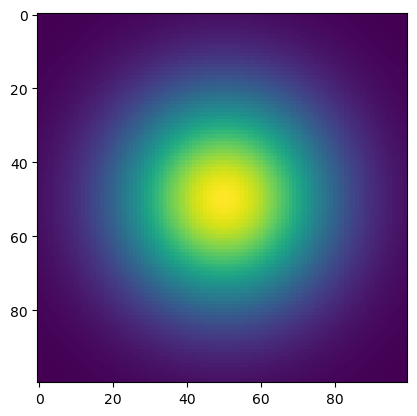

In [108]:
mu = gauss_density_pattern(100, 100, 50, 20)
plt.imshow(mu)
plt.show()

In [109]:
def mu_to_p0(mu, source, h): #mu is an array of attenuation coefficients, source is a tuple containing the x and y coordinates, h is the spacing between sampling points along the ray
    xs, ys = source
    P = np.zeros_like(mu)
    
    for yi in range(mu.shape[0]):
        for xi in range(mu.shape[1]):
            print("\n\npixel: ", xi, yi)
            m = (yi - ys) / (xi - xs)
            b = ys - m * xs
            
            d = ((xi-xs)**2 + (yi-ys)**2) **0.5 #euclidean distance between source and target
            n = int(d/h) + 1 # of discrete point
            
            dx =  (xi - xs) / (n - 1) #Fix? There are points outside the image dimensions
            dy = (yi - ys) / (n - 1)
            
            for point_i in range(n):
                x = int(np.floor(xs + (point_i * dx))) #The pixel at which the point is located
                y = int(np.floor(ys + (point_i * dy))) # ^
                print("Point: ", x,y)
                if 0 <= x < mu.shape[0] and 0 <= y < mu.shape[1]:
                    P[x,y] += mu[x,y]
                
    return mu * np.exp(-P), P
            


In [110]:
P0, P = (mu_to_p0(mu, (101,101), 1)) # source point at bottom right of image



pixel:  0 0
Point:  101 101
Point:  100 100
Point:  99 99
Point:  98 98
Point:  98 98
Point:  97 97
Point:  96 96
Point:  96 96
Point:  95 95
Point:  94 94
Point:  93 93
Point:  93 93
Point:  92 92
Point:  91 91
Point:  91 91
Point:  90 90
Point:  89 89
Point:  88 88
Point:  88 88
Point:  87 87
Point:  86 86
Point:  86 86
Point:  85 85
Point:  84 84
Point:  83 83
Point:  83 83
Point:  82 82
Point:  81 81
Point:  81 81
Point:  80 80
Point:  79 79
Point:  78 78
Point:  78 78
Point:  77 77
Point:  76 76
Point:  76 76
Point:  75 75
Point:  74 74
Point:  73 73
Point:  73 73
Point:  72 72
Point:  71 71
Point:  71 71
Point:  70 70
Point:  69 69
Point:  68 68
Point:  68 68
Point:  67 67
Point:  66 66
Point:  66 66
Point:  65 65
Point:  64 64
Point:  64 64
Point:  63 63
Point:  62 62
Point:  61 61
Point:  61 61
Point:  60 60
Point:  59 59
Point:  59 59
Point:  58 58
Point:  57 57
Point:  56 56
Point:  56 56
Point:  55 55
Point:  54 54
Point:  54 54
Point:  53 53
Point:  52 52
Point:  51 51
Po

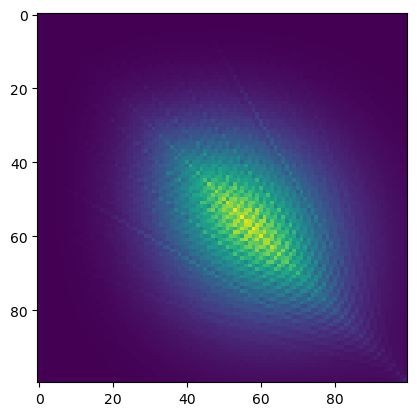

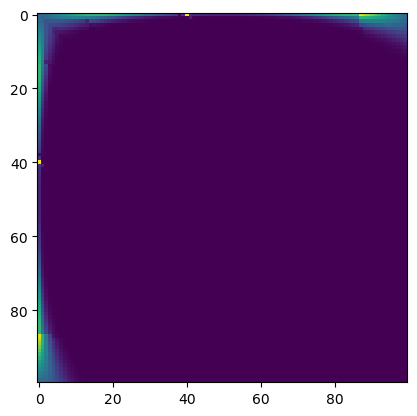

In [111]:
plt.imshow(P)
plt.show()
plt.imshow(P0)